In [1]:
import os

if "script" in os.getcwd():
    os.chdir("..")
os.getcwd()
import warnings
import json

warnings.filterwarnings("ignore")

import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt
from loguru import logger
from tqdm import tqdm
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr

from src.model.utils import get_model
from src.dataset.denoise import DenoiseTestPhase

torch.manual_seed(1234)
np.random.seed(1234)

cuda = torch.cuda.is_available()
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
logger.info(f"Device : {device}")

def show_im(im, figsize=(20, 10)):
    plt.figure(figsize=figsize)
    if isinstance(im, list):
        plt.imshow(np.hstack([i for i in im]), cmap="gray")
    else:
        plt.imshow(im, cmap="gray")
    plt.show()


def show_multi_im(imgs: list, ratio=(5, 12), figsize=(20, 10)):
    index = 0
    f, axarr = plt.subplots(ratio[0], ratio[1], figsize=figsize)
    for r in range(ratio[0]):
        for c in range(ratio[1]):

            axarr[r, c].imshow(imgs[index], cmap="gray")
            index += 1
    plt.show()

def get_infor(data, lib="torch"):
    lib = torch if lib == "torch" else np
    return f"Max: {lib.max(data)} - Min: {lib.min(data)}"

def make_dir(config, layer):
    condition = f"{config['clip']}clip_{config['normalize']}normalize_sigrange{config['sigma_range']}_{config['output_mode']}_{config['with_map']}WithMap"
    save_dir = f"report/images/LuanVan/layers_{config['model_name']}{layer}_{condition}"
    os.makedirs(os.path.join("report", "images"), exist_ok=True)
    os.makedirs(os.path.join("report", "images", "LuanVan"), exist_ok=True)
    os.makedirs(save_dir, exist_ok=True)
    return save_dir

2023-12-25 23:07:12.235 | INFO     | __main__:<cell line: 28>:28 - Device : cuda:0


In [6]:
config = {
    "layers": [10],
    "channels": 2,
    "out_channels": 1,
    "features": 192,
    "n_workers": 10,
    "scheduler_mode": min,
    "scheduler_patience": 1,
    "model_name": "dnresnet",
    "loss_function": "L1",
    "alpha_loss": [0.001],
    "sigma_range": [55],
    "weight": r"result/layers_dnresnet10_Falseclip_Truenormalize_sigrange10_10_image_withMap/model_040.pth",
    "data_dir": "data",
    "clip": False,
    "normalize": True,
    "output_mode": 'image',
    "with_map": True
}

2023-12-25 23:08:03.815 | INFO     | src.dataset.denoise:__init__:138 - Test at Sigma: 55
2023-12-25 23:08:03.819 | SUCCESS  | src.dataset.denoise:__init__:52 - test with mode: image - sigma: 55 - clip: False - normalize: True - with_map: True
2023-12-25 23:08:03.848 | INFO     | src.model.dnresnet:_initialize_weights:82 - init weight
2023-12-25 23:08:03.850 | INFO     | src.model.dnresnet:_initialize_weights:82 - init weight
2023-12-25 23:08:03.859 | INFO     | src.model.dnresnet:_initialize_weights:82 - init weight
2023-12-25 23:08:03.870 | INFO     | src.model.dnresnet:_initialize_weights:82 - init weight
2023-12-25 23:08:03.879 | INFO     | src.model.dnresnet:_initialize_weights:82 - init weight
2023-12-25 23:08:03.887 | INFO     | src.model.dnresnet:_initialize_weights:82 - init weight
2023-12-25 23:08:03.898 | INFO     | src.model.dnresnet:_initialize_weights:82 - init weight
2023-12-25 23:08:03.907 | INFO     | src.model.dnresnet:_initialize_weights:82 - init weight
2023-12-25 2

Max: 1.698039174079895 - Min: 0.0
Max: 1.0 - Min: 0.0
Max: 0.9948981404304504 - Min: -0.012595054693520069


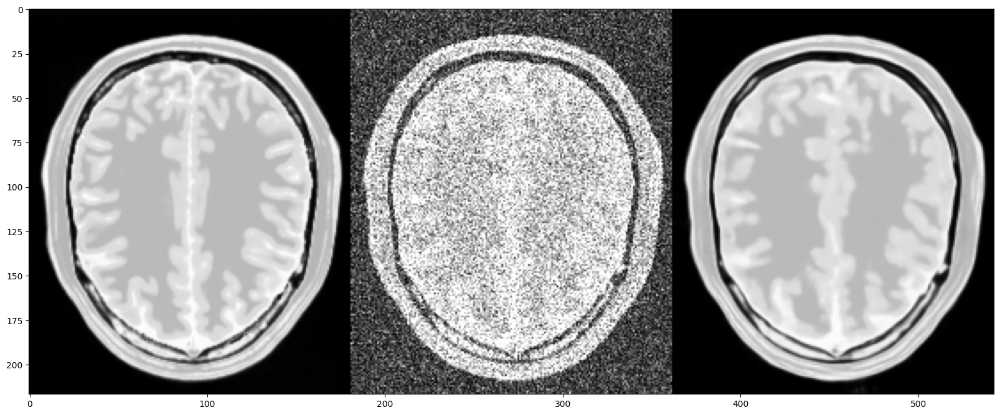

sigma 55: 1it [00:06,  6.24s/it]

Max: 1.458823561668396 - Min: 0.0
Max: 1.0 - Min: 0.0
Max: 0.9857974052429199 - Min: -0.02667304314672947


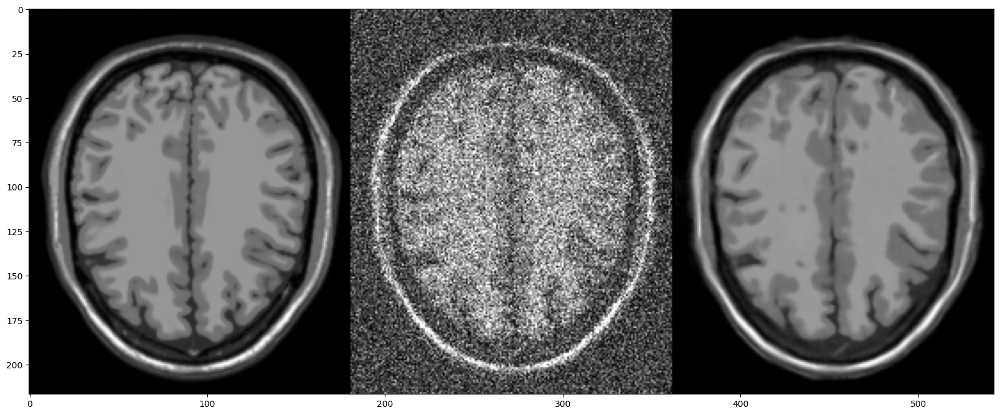

sigma 55: 2it [00:06,  2.89s/it]

Max: 1.6392157077789307 - Min: 0.0
Max: 1.0 - Min: 0.0
Max: 1.0026068687438965 - Min: -0.060685787349939346


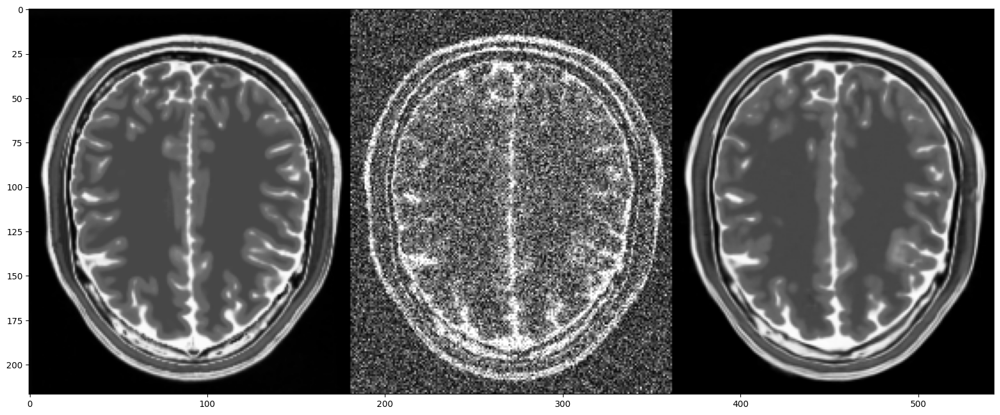

sigma 55: 3it [00:07,  1.82s/it]

Max: 1.768627405166626 - Min: 0.0
Max: 1.0 - Min: 0.0
Max: 0.9925404191017151 - Min: -0.017938533797860146


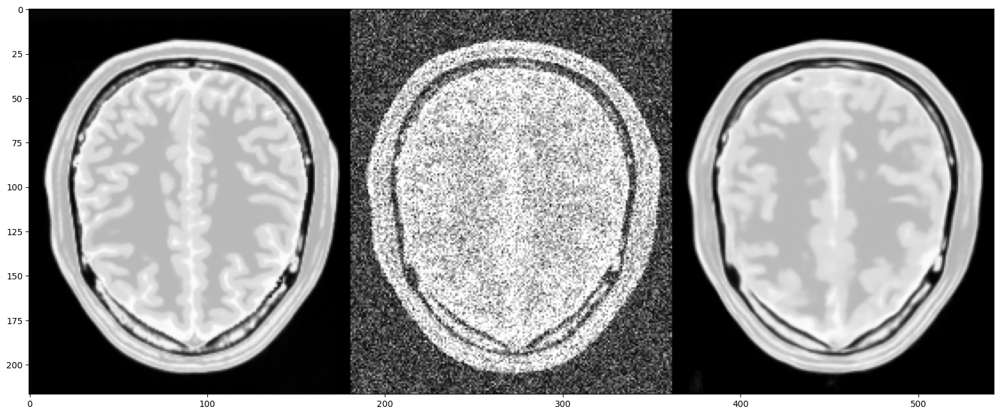

sigma 55: 4it [00:07,  1.33s/it]

Max: 1.5843137502670288 - Min: 0.0
Max: 1.0 - Min: 0.0
Max: 1.000517725944519 - Min: -0.019717847928404808


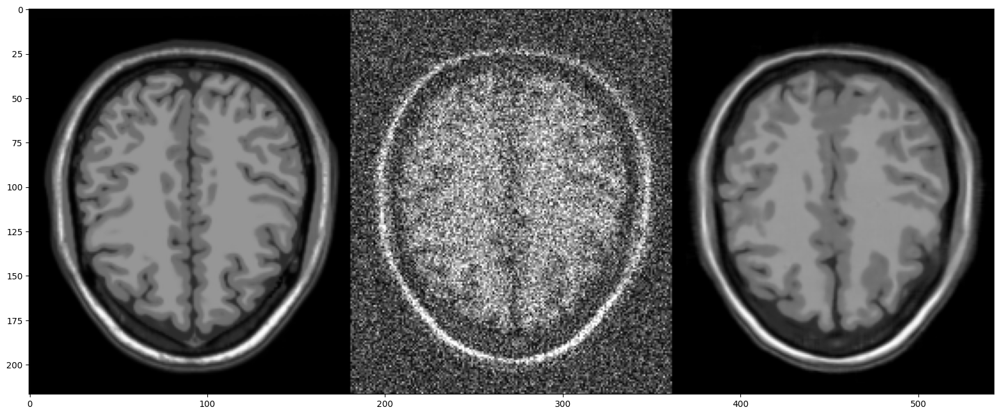

sigma 55: 5it [00:08,  1.07s/it]

Max: 1.6784313917160034 - Min: 0.0
Max: 1.0 - Min: 0.0
Max: 1.0011504888534546 - Min: -0.05242116376757622


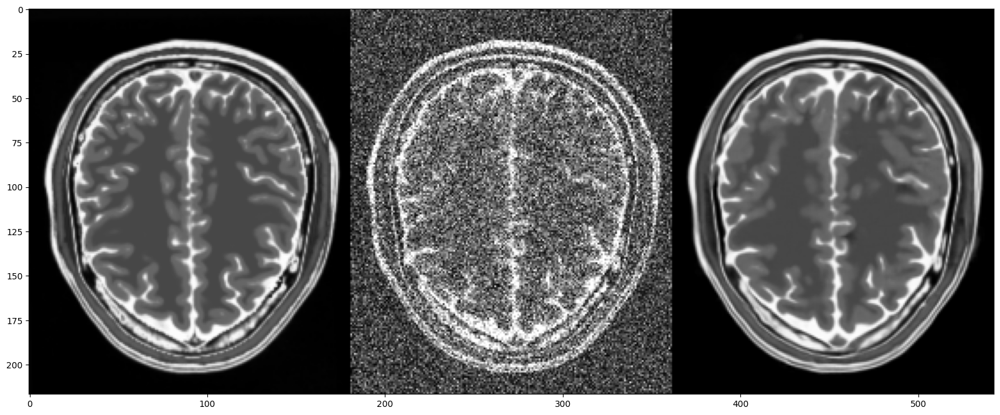

sigma 55: 6it [00:09,  1.09it/s]

Max: 1.6941176652908325 - Min: 0.0
Max: 1.0 - Min: 0.0
Max: 0.9926753640174866 - Min: -0.012048115022480488


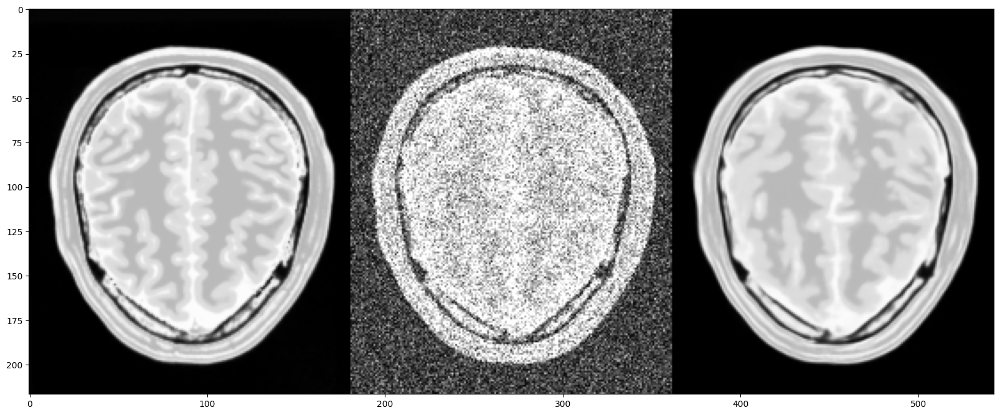

sigma 55: 7it [00:09,  1.25it/s]

Max: 1.529411792755127 - Min: 0.0
Max: 1.0 - Min: 0.0
Max: 0.9927089810371399 - Min: -0.014791561290621758


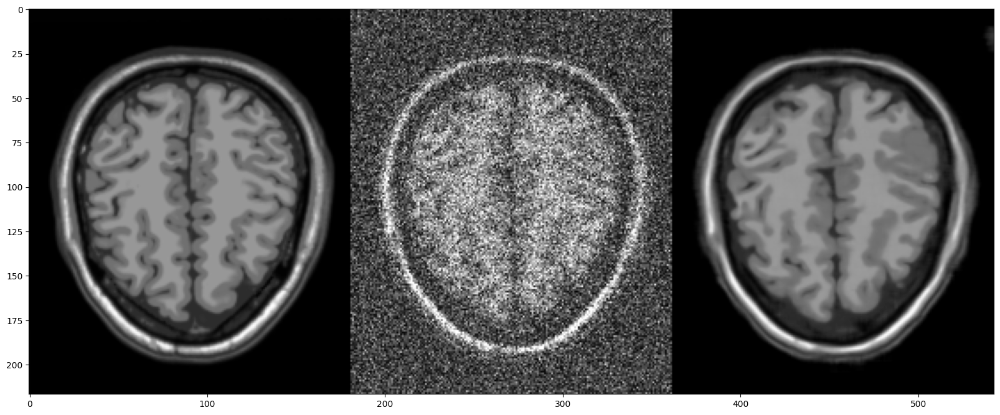

sigma 55: 8it [00:10,  1.39it/s]

Max: 1.6235294342041016 - Min: 0.0
Max: 1.0 - Min: 0.0
Max: 1.0042842626571655 - Min: -0.02892160974442959


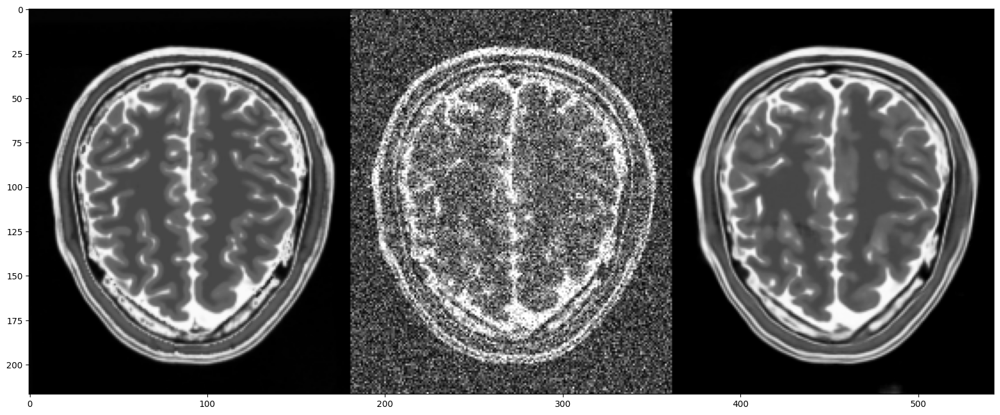

sigma 55: 9it [00:10,  1.49it/s]

Max: 1.8196078538894653 - Min: 0.0
Max: 1.0 - Min: 0.0
Max: 0.9960227608680725 - Min: -0.009931431151926517


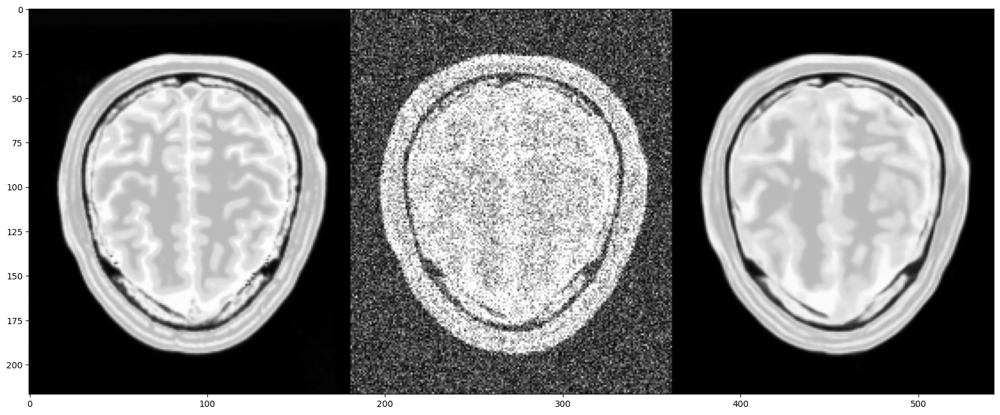

sigma 55: 10it [00:11,  1.58it/s]

Max: 1.611764669418335 - Min: 0.0
Max: 1.0 - Min: 0.0
Max: 0.9677663445472717 - Min: -0.03882469981908798


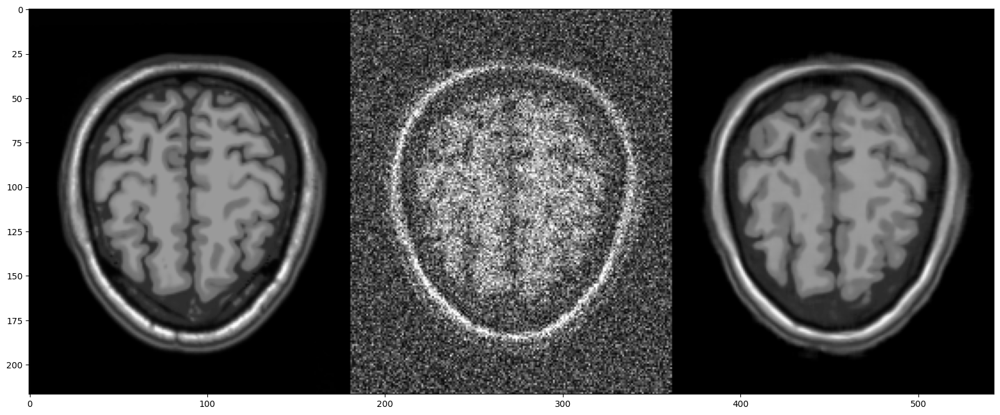

sigma 55: 11it [00:12,  1.10s/it]


Max: 1.6941176652908325 - Min: 0.0
Max: 1.0 - Min: 0.0
Max: 0.9964941740036011 - Min: -0.02572350949048996


KeyboardInterrupt: 

In [7]:
for layer in config["layers"]:
    save_dir = make_dir(config, layer)

    test_phase = DenoiseTestPhase(
            range_sigma=config["sigma_range"],
            step=5,
            data_dir="data",
            n_workers=1,
            batch_size=1,
            log_dir=f"{save_dir}_test",
            normalize=config["normalize"],
            clip=config["clip"],
            device=config.get("device", device),
            output_mode=config['output_mode'],
            with_map=config['with_map']
        )

    epoch_psnr = {}
    epoch_ssim = {}

    model = get_model(
        name=config["model_name"],
        layers=layer,
        input_channels=config["channels"],
        feature=config["features"],
        out_channels=config.get("out_channels", 1)
    )
    model.eval()
    check_point = torch.load(config["weight"])
    # model = torch.load(os.path.join(save_dir, "model_%03d.pth" % initial_epoch))
    model.load_state_dict(check_point)
    model.cuda()

    for sigma in config["sigma_range"]:
        sigma_savedir = os.path.join(save_dir,f"sigma{sigma}")
        os.makedirs(sigma_savedir, exist_ok=True)
        epoch_psnr[sigma] = 0
        epoch_ssim[sigma] = 0
        for i, data in tqdm(enumerate(test_phase.dataloader[sigma]), desc=f"sigma {sigma}"):

            noisy_imgs, GT = data[0].to(test_phase.device), data[1].to(test_phase.device)
            print(get_infor(noisy_imgs))
            print(get_infor(GT))

            predicted = model(noisy_imgs)
            print(get_infor(predicted))
            if test_phase.output_mode:
                clean_imgs = noisy_imgs - GT
                denoise_imgs = noisy_imgs - predicted
            else:
                clean_imgs = GT
                denoise_imgs = predicted
            if test_phase.normalize:
                clean_imgs = clean_imgs * 255
                denoise_imgs = denoise_imgs * 255

            clean_imgs = clean_imgs.clamp(0, 255)
            denoise_imgs = denoise_imgs.clamp(0, 255)

            clean_imgs = clean_imgs.cpu().detach().numpy().astype(np.uint8).squeeze(0).squeeze(0)
            denoise_imgs = denoise_imgs.cpu().detach().numpy().astype(np.uint8).squeeze(0).squeeze(0)
            if noisy_imgs.shape[1] == 2:
                noisy_imgs = noisy_imgs[:,0,:,:]
                noisy_imgs = (noisy_imgs*255).clamp(0,255).cpu().detach().numpy().astype(np.uint8).squeeze(0)
            else:
                noisy_imgs = (noisy_imgs*255).clamp(0,255).cpu().detach().numpy().astype(np.uint8).squeeze(0).squeeze(0)
            show_im([clean_imgs, noisy_imgs, denoise_imgs])
            # cv2.imwrite(os.path.join(save_dir, f"{i}.png"), np.hstack([clean_imgs, (noisy_imgs*255).clamp(0,255).cpu().detach().numpy().astype(np.uint8).squeeze(0).squeeze(0), denoise_imgs]))
            # cv2.imwrite(os.path.join(sigma_savedir, f"{i}.png"), denoise_imgs)


            # print(f"PSNR: {psnr(clean_imgs, denoise_imgs)} - SSIM: {ssim(clean_imgs, denoise_imgs)}")
            epoch_psnr[sigma] += psnr(clean_imgs, denoise_imgs)
            epoch_ssim[sigma] += ssim(clean_imgs, denoise_imgs)

        epoch_psnr[sigma] = round(epoch_psnr[sigma] / len(test_phase.dataloader[sigma]), 4)
        epoch_ssim[sigma] = round(epoch_ssim[sigma] / len(test_phase.dataloader[sigma]), 8)
    logger.info("PSNR:\n" + json.dumps(epoch_psnr, sort_keys=True, indent=4))
    logger.info("SSIM:\n" + json.dumps(epoch_ssim, sort_keys=True, indent=4))
